# Text-to-Image Diffusion Tutorial

**Goal:** understand diffusion-based text-to-image generation (Stable Diffusion) and run structured experiments:
- diffusion steps (quality vs speed)
- schedulers (DDIM vs DPM-Solver vs Euler A)
- classifier-free guidance (CFG)
- negative prompts
- a manual sampling loop (to demystify what's inside the pipeline)

> **Recommended runtime:** Google Colab **GPU (T4)**.  
> If you hit OOM, use smaller image size (e.g., 384) or fewer steps.


## Learning objectives (what students should be able to do after this tutorial)

By the end of this tutorial, students should be able to:

1. Explain the **forward** and **reverse** diffusion processes at a high level.
2. Identify the roles of Stable Diffusion’s main components: **CLIP text encoder**, **U-Net**, **VAE**, and **scheduler**.
3. Run controlled experiments and reason about how:
   - the number of steps affects quality and runtime,
   - different schedulers affect sampling behavior,
   - CFG (guidance scale) affects prompt adherence vs artifacts,
   - negative prompts suppress common failure modes.
4. Understand (and implement) a **manual sampling loop** at the level of calling `unet` + `scheduler.step`.

## 0) Setup (install + GPU check)

### What you will learn
- How to configure a free Colab GPU runtime for diffusion inference.
- Why **CUDA + fp16** matters for Stable Diffusion speed and memory.

### Notes
- If `nvidia-smi` fails, you are not on a GPU runtime (Colab: `Runtime → Change runtime type → GPU`).
- Package versions can change; we install/upgrade to reduce compatibility issues.

In [1]:
!nvidia-smi
!pip install -q --upgrade diffusers transformers accelerate safetensors

# If you are on Colab: Runtime → Change runtime type → GPU
# Then re-run this cell.

Tue Jan 27 10:38:47 2026       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 550.54.15              Driver Version: 550.54.15      CUDA Version: 12.4     |
|-----------------------------------------+------------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+======================|
|   0  Tesla T4                       Off |   00000000:00:04.0 Off |                    0 |
| N/A   41C    P8              9W /   70W |       0MiB /  15360MiB |      0%      Default |
|                                         |                        |                  N/A |
+-----------------------------------------+-----

## 1) Imports + utilities

### Why this section exists (tutorial mindset)
Generative model demos are easy to run but hard to **analyze**.  
To make this a proper tutorial, we add two utilities:

1. **Reproducibility (`set_seed`)**  
   Diffusion sampling is stochastic. Fixing the seed lets us run **controlled experiments**.
2. **Visualization (`show_images_grid`)**  
   Most learning happens by comparing outputs side-by-side.

> In this notebook, we frequently **hold everything constant** and vary *one factor* (prompt / steps / scheduler / CFG).

In [2]:
import os, time, math, random
import numpy as np
import torch
from PIL import Image
import matplotlib.pyplot as plt

# Reproducibility helper: fixes randomness in PyTorch/NumPy/Python
# so that experiments are comparable.

def set_seed(seed: int = 42):
    random.seed(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed_all(seed)

def show_images_grid(images, titles=None, cols=3, figsize=(12, 8)):
    if titles is None:
        titles = [""] * len(images)
    rows = math.ceil(len(images) / cols)
    plt.figure(figsize=figsize)
    for i, (img, title) in enumerate(zip(images, titles), 1):
        ax = plt.subplot(rows, cols, i)
        ax.imshow(img)
        ax.set_title(title, fontsize=10)
        ax.axis("off")
    plt.tight_layout()
    plt.show()

print("Torch:", torch.__version__)
print("CUDA available:", torch.cuda.is_available())

Torch: 2.9.0+cu126
CUDA available: True


## 2) Load Stable Diffusion (v1.5)

We use fp16 on GPU for speed/memory and enable attention slicing for Colab stability.


### Key concepts introduced
- **Pipeline**: an engineering wrapper that bundles text encoder + U-Net + VAE + scheduler.
- **Half precision (fp16)**: lowers memory usage and speeds up inference on GPU.
- **Memory knobs** for free Colab GPUs:
  - `enable_attention_slicing()` reduces peak memory.
  - `enable_xformers_memory_efficient_attention()` can reduce memory and speed up attention (if available).

### Practical tip
If you hit out-of-memory (OOM):
- reduce `height/width` (e.g., 384×384)
- reduce steps (e.g., 20)
- avoid generating too many images in one cell

In [3]:
from diffusers import StableDiffusionPipeline

device = "cuda" if torch.cuda.is_available() else "cpu"
dtype = torch.float16 if device == "cuda" else torch.float32

model_id = "runwayml/stable-diffusion-v1-5"

pipe = StableDiffusionPipeline.from_pretrained(
    model_id,
    torch_dtype=dtype,
    safety_checker=None,  # remove if you need safety checker
).to(device)

pipe.enable_attention_slicing()

try:
    pipe.enable_xformers_memory_efficient_attention()
    print("xformers enabled ✅")
except Exception as e:
    print("xformers not available (ok):", type(e).__name__)

print("Loaded:", model_id)

# Note: safety_checker=None is convenient for technical teaching demos.
# If your course requires safety filtering, remove that line.

Flax classes are deprecated and will be removed in Diffusers v1.0.0. We recommend migrating to PyTorch classes or pinning your version of Diffusers.
Flax classes are deprecated and will be removed in Diffusers v1.0.0. We recommend migrating to PyTorch classes or pinning your version of Diffusers.
/usr/local/lib/python3.12/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


model_index.json:   0%|          | 0.00/541 [00:00<?, ?B/s]

Fetching 13 files:   0%|          | 0/13 [00:00<?, ?it/s]

Loading pipeline components...:   0%|          | 0/6 [00:00<?, ?it/s]

Loading weights:   0%|          | 0/196 [00:00<?, ?it/s]

CLIPTextModel LOAD REPORT from: /root/.cache/huggingface/hub/models--runwayml--stable-diffusion-v1-5/snapshots/451f4fe16113bff5a5d2269ed5ad43b0592e9a14/text_encoder
Key                                | Status     |  | 
-----------------------------------+------------+--+-
text_model.embeddings.position_ids | UNEXPECTED |  | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.
You have disabled the safety checker for <class 'diffusers.pipelines.stable_diffusion.pipeline_stable_diffusion.StableDiffusionPipeline'> by passing `safety_checker=None`. Ensure that you abide to the conditions of the Stable Diffusion license and do not expose unfiltered results in services or applications open to the public. Both the diffusers team and Hugging Face strongly recommend to keep the safety filter enabled in all public facing circumstances, disabling it only for use-cases that involve analyzing network behavior or auditing its resul

xformers not available (ok): ModuleNotFoundError
Loaded: runwayml/stable-diffusion-v1-5


## 3) Baseline generation

### Goal of the baseline
Before doing experiments, we establish a working baseline:
- a **prompt** (what we want)
- a **negative prompt** (what we want to suppress)
- typical defaults: `steps≈25`, `guidance_scale≈7.5`, `512×512`

### What to observe
- Is the image aligned with the prompt?
- Any artifacts (extra limbs, distortion, blur)?
- How consistent is the output when we keep the same seed?

  0%|          | 0/25 [00:00<?, ?it/s]

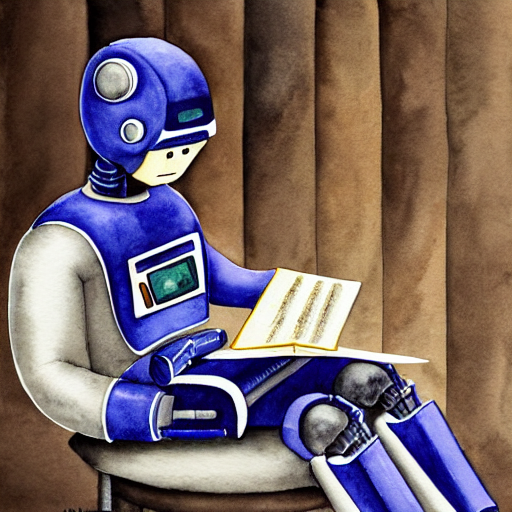

In [4]:
set_seed(123)

prompt = "a watercolor painting of a robot reading a book, soft lighting, highly detailed"
negative_prompt = "blurry, low quality, distorted, ugly"

image = pipe(
    prompt,
    negative_prompt=negative_prompt,
    num_inference_steps=25,
    guidance_scale=7.5,
    height=512,
    width=512,
).images[0]

image

## 4) Inspect SD components

### Stable Diffusion = (Text Encoder) + (U-Net) + (VAE) + (Scheduler)

1. **Text encoder (CLIP text)**  
   Converts tokens into **text embeddings** (conditioning signal).

2. **U-Net denoiser**  
   Predicts the noise to remove at each timestep:  
   \[
   \epsilon_\theta(x_t, t, \text{text})
   \]

3. **VAE**  
   Maps image ↔ latent. Diffusion runs in **latent space** (efficient).

4. **Scheduler**  
   A numerical method that defines the timesteps and the update rule during sampling.

> A common misconception: “the model draws pixels directly.”  
> In Stable Diffusion, the model iteratively refines a **latent tensor**, then decodes it with the VAE.

In [5]:
pipe.text_encoder, pipe.unet, pipe.vae

(CLIPTextModel(
   (text_model): CLIPTextTransformer(
     (embeddings): CLIPTextEmbeddings(
       (token_embedding): Embedding(49408, 768)
       (position_embedding): Embedding(77, 768)
     )
     (encoder): CLIPEncoder(
       (layers): ModuleList(
         (0-11): 12 x CLIPEncoderLayer(
           (self_attn): CLIPAttention(
             (k_proj): Linear(in_features=768, out_features=768, bias=True)
             (v_proj): Linear(in_features=768, out_features=768, bias=True)
             (q_proj): Linear(in_features=768, out_features=768, bias=True)
             (out_proj): Linear(in_features=768, out_features=768, bias=True)
           )
           (layer_norm1): LayerNorm((768,), eps=1e-05, elementwise_affine=True)
           (mlp): CLIPMLP(
             (activation_fn): QuickGELUActivation()
             (fc1): Linear(in_features=768, out_features=3072, bias=True)
             (fc2): Linear(in_features=3072, out_features=768, bias=True)
           )
           (layer_norm2): La

## 5) Experiment A — Prompt variations (controlled)

### Experiment design
- Fix seed, steps, CFG, resolution.
- Only vary the **prompt wording**.

### Why this matters
Prompting is not magic: it changes the **conditioning embedding**, which changes the sampled distribution.

### What to compare
- Composition (close-up vs wide shot)
- Style (watercolor vs photo)
- Texture and sharpness
- Whether the “robot reading a book” concept is preserved

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

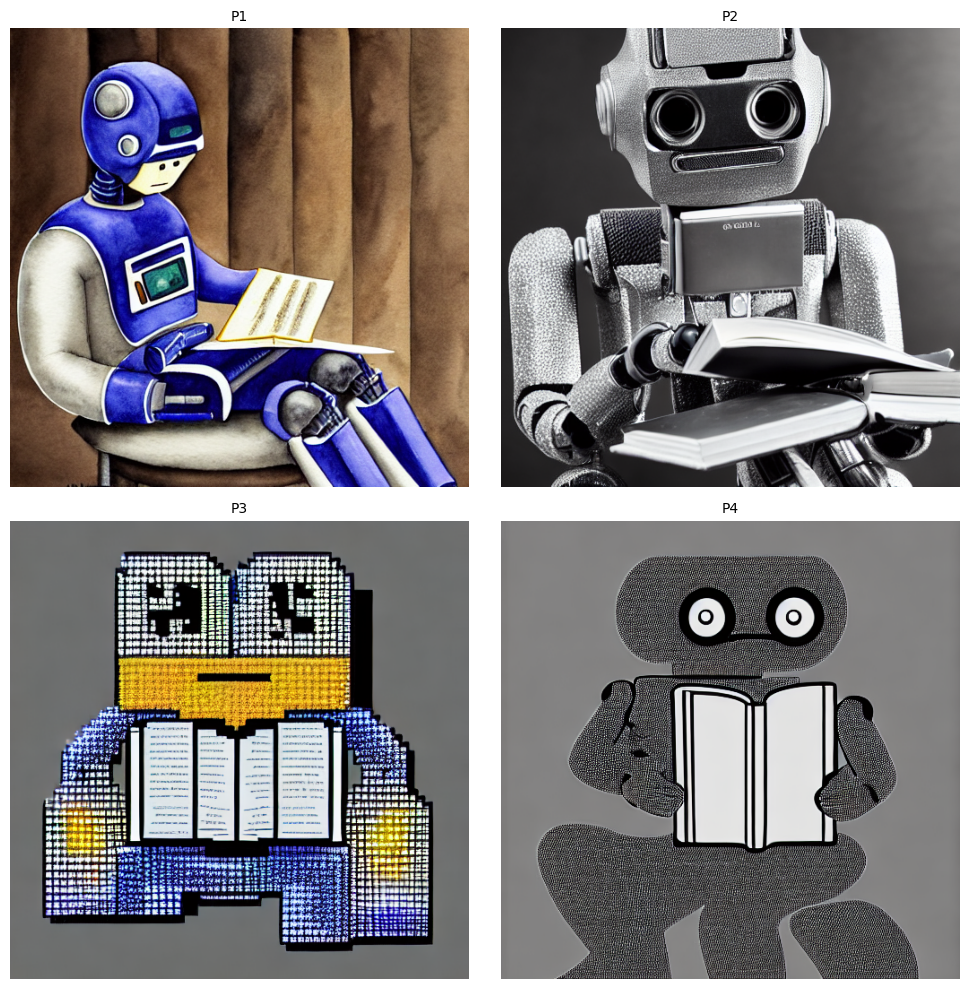

In [6]:
set_seed(123)

base_cfg = dict(
    negative_prompt=negative_prompt,
    num_inference_steps=25,
    guidance_scale=7.5,
    height=512,
    width=512,
)

prompts = [
    "a watercolor painting of a robot reading a book, soft lighting, highly detailed",
    "a cinematic photo of a robot reading a book, 35mm, shallow depth of field",
    "a cute pixel-art robot reading a book, 16-bit style, crisp edges",
    "a minimalist illustration of a robot reading a book, flat colors, poster design",
]

imgs = []
for p in prompts:
    set_seed(123)
    imgs.append(pipe(p, **base_cfg).images[0])

show_images_grid(imgs, titles=[f'P{i+1}' for i in range(len(prompts))], cols=2, figsize=(10, 10))

## 6) Experiment B — Steps sweep (quality vs speed)

### Key idea: Steps control the sampling budget
More steps typically improve quality/stability but cost time.

**Trade-off:**
- Few steps → faster, but can be noisy / less aligned
- Many steps → slower, but often sharper and more coherent

### What to log / discuss
- Runtime per image
- Visual quality / artifacts
- Diminishing returns (beyond some step count, improvements may be small)

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

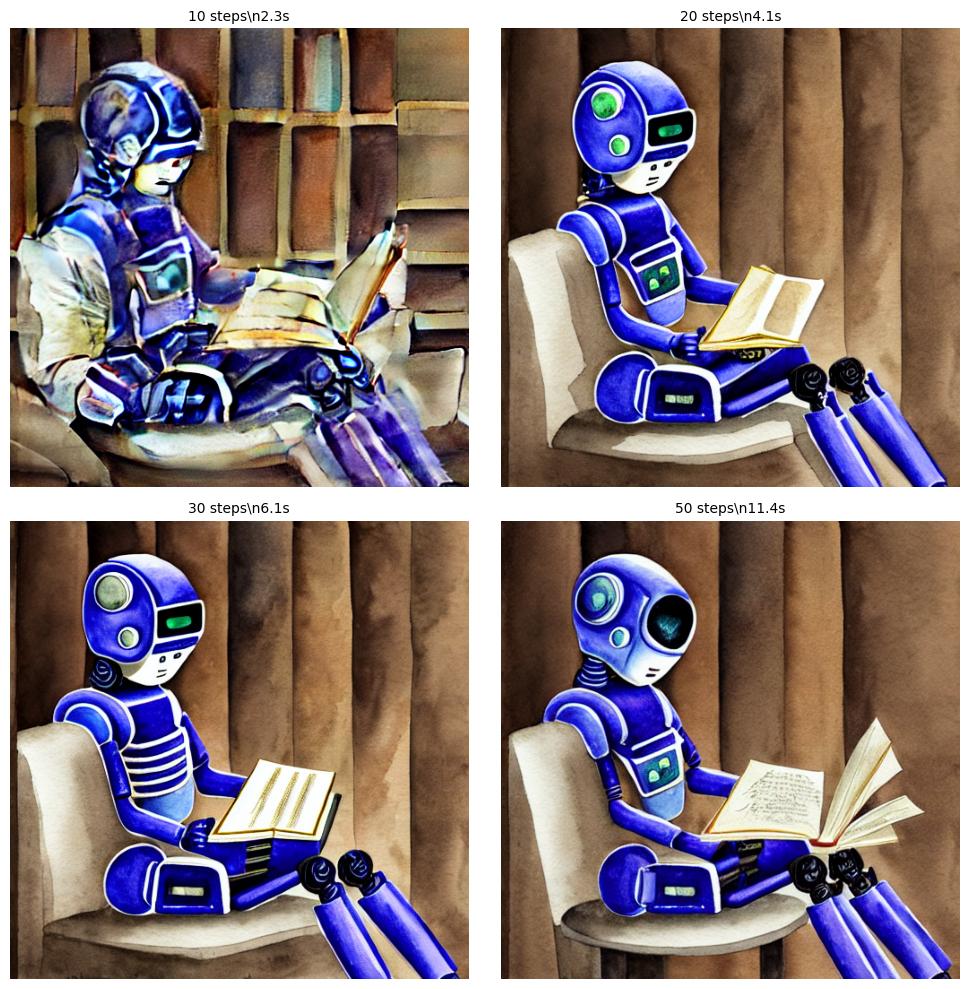

In [7]:
from time import perf_counter

# Core generation helper used in multiple experiments.
# We return both the image and runtime to quantify the speed/quality trade-off.

def generate(prompt, negative_prompt=None, steps=25, guidance=7.5, height=512, width=512, seed=123):
    set_seed(seed)
    t0 = perf_counter()
    out = pipe(
        prompt,
        negative_prompt=negative_prompt,
        num_inference_steps=steps,
        guidance_scale=guidance,
        height=height,
        width=width,
    ).images[0]
    t1 = perf_counter()
    return out, (t1 - t0)

steps_list = [10, 20, 30, 50]
imgs, times = [], []
for s in steps_list:
    img, sec = generate(prompt, negative_prompt=negative_prompt, steps=s, seed=123)
    imgs.append(img); times.append(sec)

titles = [f"{s} steps\\n{sec:.1f}s" for s, sec in zip(steps_list, times)]
show_images_grid(imgs, titles=titles, cols=2, figsize=(10, 10))

## 7) Experiment C — Scheduler comparison

### What is a scheduler?
The scheduler is the **numerical recipe** for stepping through timesteps.  
Same model weights, different scheduler → different sampling trajectory.

We compare:
- **DDIM** (often smooth, deterministic-ish)
- **DPM-Solver** (fast and strong quality per step)
- **Euler A (ancestral)** (can add “creative” stochasticity)

### What to observe
- Sharpness vs smoothness
- Faithfulness to prompt
- Style/texture differences

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

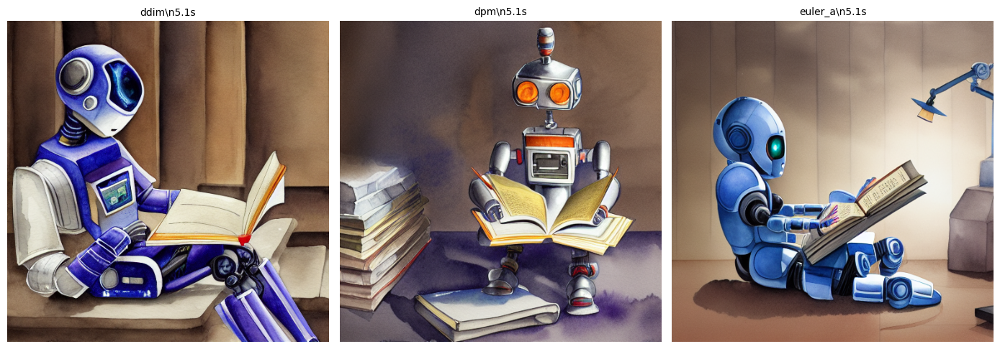

In [8]:
from diffusers import DDIMScheduler, DPMSolverMultistepScheduler, EulerAncestralDiscreteScheduler

# Factory to swap schedulers without changing model weights.
# Scheduler choice can change sharpness/texture/style for the same prompt.

def make_scheduler(name: str):
    name = name.lower()
    if name == "ddim":
        return DDIMScheduler.from_config(pipe.scheduler.config)
    if name in ["dpm", "dpm-solver", "dpmsolver"]:
        return DPMSolverMultistepScheduler.from_config(pipe.scheduler.config)
    if name in ["euler_a", "euler-ancestral", "euler ancestral", "euler"]:
        return EulerAncestralDiscreteScheduler.from_config(pipe.scheduler.config)
    raise ValueError("Unknown scheduler name. Use: ddim, dpm, euler_a")

def generate_with_scheduler(prompt, scheduler_name, steps=25, guidance=7.5, seed=123):
    old = pipe.scheduler
    pipe.scheduler = make_scheduler(scheduler_name)
    img, sec = generate(prompt, negative_prompt=negative_prompt, steps=steps, guidance=guidance, seed=seed)
    pipe.scheduler = old
    return img, sec

scheds = ["ddim", "dpm", "euler_a"]
imgs, times = [], []
for sc in scheds:
    img, sec = generate_with_scheduler(prompt, sc, steps=25, guidance=7.5, seed=123)
    imgs.append(img); times.append(sec)

titles = [f"{sc}\\n{sec:.1f}s" for sc, sec in zip(scheds, times)]
show_images_grid(imgs, titles=titles, cols=3, figsize=(14, 5))

## 8) Experiment D — CFG sweep

### Classifier-Free Guidance (CFG) intuition
CFG controls how strongly the generation follows the prompt.

- Low CFG → weak conditioning (can drift)
- Medium CFG → good balance (often ~7.5)
- High CFG → over-conditioning, can create artifacts (“overcooked”)

### How to present this in class
Ask students: *At what CFG does the image look best for this prompt?*  
The best value depends on prompt, scheduler, and steps.

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

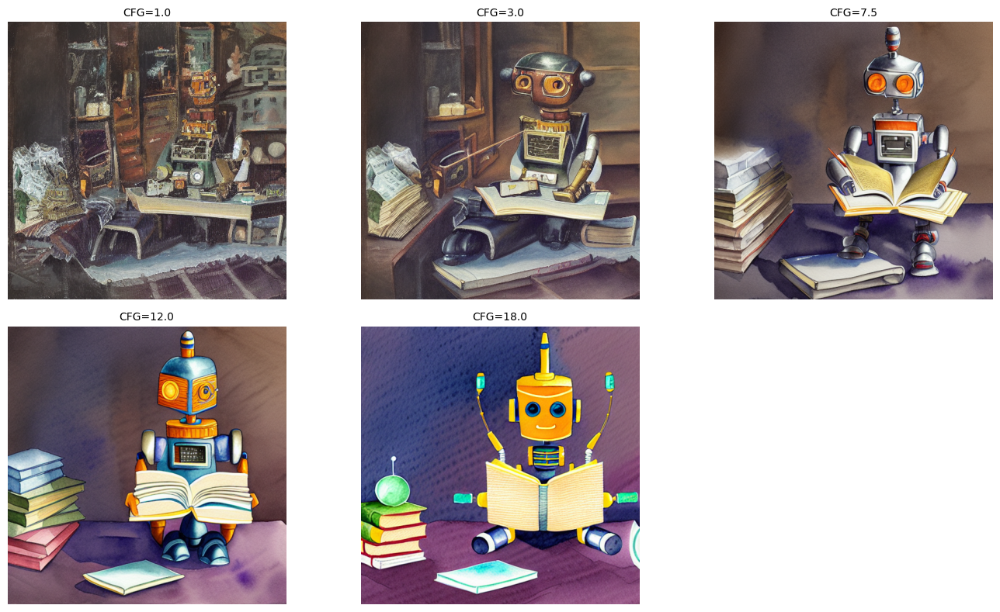

In [9]:
guidances = [1.0, 3.0, 7.5, 12.0, 18.0]
imgs = []

old = pipe.scheduler
pipe.scheduler = make_scheduler("dpm")

for g in guidances:
    img, _ = generate(prompt, negative_prompt=negative_prompt, steps=25, guidance=g, seed=123)
    imgs.append(img)

pipe.scheduler = old

titles = [f"CFG={g}" for g in guidances]
show_images_grid(imgs, titles=titles, cols=3, figsize=(14, 8))

## 9) Experiment E — Negative prompt effect

### Negative prompts: practical control knob
Negative prompts push the model away from undesired concepts/artifacts.

This is commonly used to reduce:
- blur, low quality
- deformations (extra limbs, weird faces)
- text artifacts

### What to observe
Compare artifact frequency with vs without negative prompts.

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

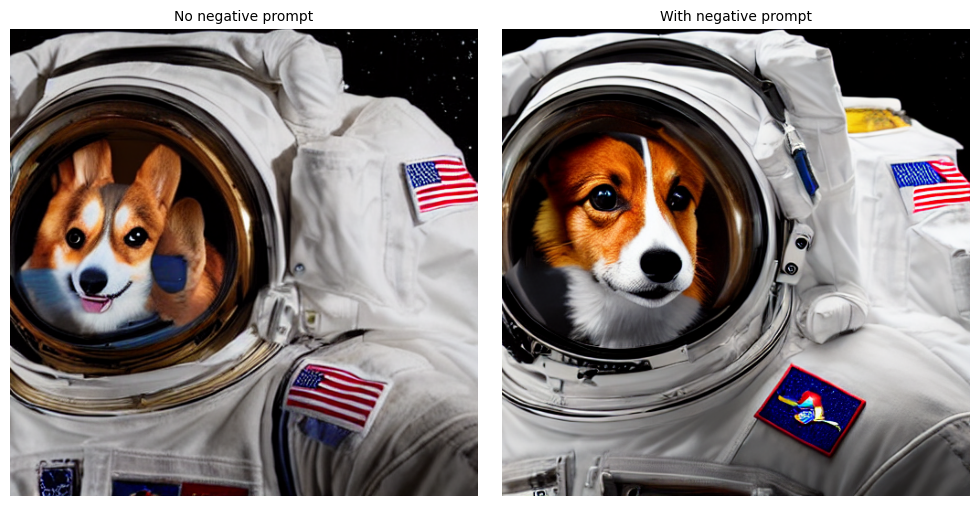

In [10]:
p = "a portrait photo of a corgi astronaut, high detail, studio lighting"
imgs = []

set_seed(321)
imgs.append(pipe(p, num_inference_steps=25, guidance_scale=7.5).images[0])

set_seed(321)
imgs.append(pipe(p, negative_prompt="blurry, low quality, extra limbs, deformed", num_inference_steps=25, guidance_scale=7.5).images[0])

show_images_grid(imgs, titles=["No negative prompt", "With negative prompt"], cols=2, figsize=(10, 5))

## 10) Latent space vs image space

### Why latent diffusion is efficient
Diffusion in pixel space would operate on `(3, 512, 512)` ≈ **786k** values.

Stable Diffusion diffuses in a compressed latent `(4, 64, 64)` ≈ **16k** values.

That is ~**48× fewer elements** per step, enabling:
- faster sampling
- less memory use
- practical text-to-image on consumer GPUs

In [11]:
H, W = 512, 512
latent_shape = (1, 4, H//8, W//8)
image_shape = (1, 3, H, W)
print("Latent shape:", latent_shape, "=> elements:", int(np.prod(latent_shape)))
print("Image shape: ", image_shape,  "=> elements:", int(np.prod(image_shape)))
print("Element ratio (image/latent):", float(np.prod(image_shape)/np.prod(latent_shape)))

Latent shape: (1, 4, 64, 64) => elements: 16384
Image shape:  (1, 3, 512, 512) => elements: 786432
Element ratio (image/latent): 48.0


## 11) Manual diffusion loop (short demo)

This cell shows what the pipeline is doing internally:
1) tokenize + text encoder → `text_embeds`
2) init `latents`
3) loop: unet predicts noise, scheduler updates latents
4) VAE decodes latents → image

**Important:** keep dtypes consistent (fp16) to avoid `Float vs Half` errors.


### This is the “demystify the pipeline” section
We explicitly reproduce the sampling process:

1. Tokenize prompt → text encoder → **text embeddings**
2. Initialize random **latents** (noise)
3. Repeat over timesteps:
   - U-Net predicts noise
   - Scheduler updates latents
4. VAE decodes latents → image

### Important engineering note (common bug!)
Stable Diffusion is often run in **fp16**.
To avoid dtype errors (`Float` vs `Half`), ensure:
- `text_embeds` is fp16
- `latents` is fp16
- model is fp16

/usr/local/lib/python3.12/dist-packages/huggingface_hub/utils/_validators.py:202: UserWarning: The `local_dir_use_symlinks` argument is deprecated and ignored in `hf_hub_download`. Downloading to a local directory does not use symlinks anymore.
  warnings.warn(


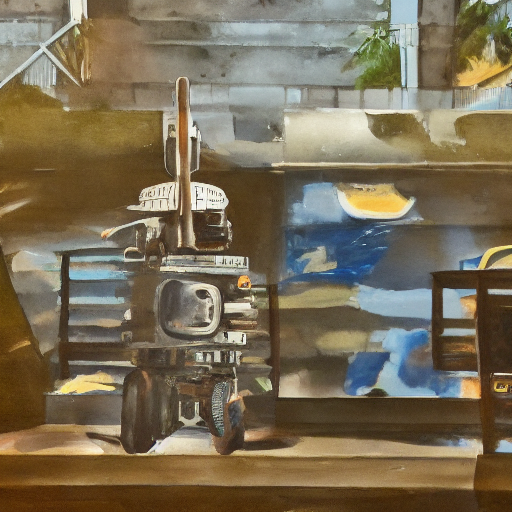

In [12]:
from diffusers import DDIMScheduler

manual_scheduler = DDIMScheduler.from_pretrained(model_id, subfolder="scheduler")

# Text embeddings (match dtype)
# Tip: the text encoder outputs float32 by default in some setups; we cast to `dtype`.

text_input = pipe.tokenizer(prompt, return_tensors="pt").to(device)
with torch.no_grad():
    text_embeds = pipe.text_encoder(**text_input).last_hidden_state
text_embeds = text_embeds.to(dtype)

# Latents (match dtype)
# latents are the *diffusion state* in latent space: shape (1,4,64,64) for 512x512.

latents = torch.randn((1, 4, 64, 64), device=device, dtype=dtype)

manual_scheduler.set_timesteps(15)

for t in manual_scheduler.timesteps:
    with torch.no_grad():
        noise_pred = pipe.unet(latents, t, encoder_hidden_states=text_embeds).sample
    latents = manual_scheduler.step(noise_pred, t, latents).prev_sample

with torch.no_grad():
    img_lat = pipe.vae.decode(latents / 0.18215).sample

img_lat = (img_lat / 2 + 0.5).clamp(0, 1)
img_lat = img_lat.detach().cpu().permute(0, 2, 3, 1).numpy()[0]
Image.fromarray((img_lat * 255).astype("uint8"))

## 12) Optional: smaller resolution quick run (if you hit OOM)

### When to use this
On free Colab GPUs, you may hit OOM at 512×512, especially if you run many experiments.

Lower resolution (e.g., 384×384) is a good emergency option.
You can still demonstrate:
- steps vs quality
- scheduler differences
- CFG sweep

  0%|          | 0/20 [00:00<?, ?it/s]

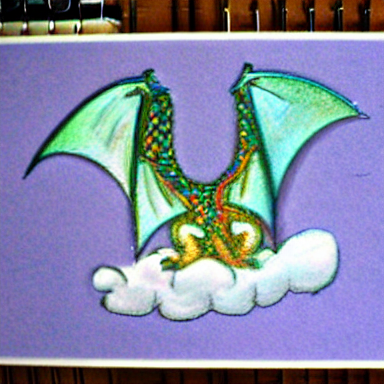

In [13]:
small_prompt = "a small cute dragon made of clouds, dreamy"
img = pipe(
    small_prompt,
    num_inference_steps=20,
    guidance_scale=7.5,
    height=384,
    width=384,
).images[0]
img

## 13) Challenge questions

1. Fix seed, compare **DDIM vs DPM vs Euler A** for 20, 30, 50 steps. What changes most?
2. Sweep CFG from 1 → 20. Where does quality peak for your prompt?
3. Design a negative prompt that removes a specific artifact you observe.
4. (Research) Why latent diffusion helps? What is the cost of using a VAE?


### Suggested classroom flow
- Assign 1–2 challenge questions as live exercises (5–10 min).
- Use the rest as homework or discussion prompts.

### Research discussion prompts
- Why does DPM-Solver often look good with fewer steps?
- What are the limitations of VAE-based latents (loss of fine details)?
- How would you extend this to **LoRA** or **ControlNet**?